In [2]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')

plt.rcParams['image.cmap'] = 'Pastel1'

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=150, color_map='viridis', transparent=True,ipython_format="png2x")
sc.logging.print_header()
%load_ext autoreload
%autoreload 2

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.4 pandas==1.1.2 scikit-learn==0.24.0 statsmodels==0.12.1 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.8.2
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


This is based on Ni Huang code for the marker discovery also found https://github.com/Teichlab/sctk/blob/master/sctk/_markers.py

In [4]:
from collections import defaultdict
import scipy.sparse as sp
from sklearn.preprocessing import normalize

def calc_marker_stats(ad, groupby, genes=None, use_rep='raw', inplace=False, partial=False):
    if ad.obs[groupby].dtype.name != 'category':
        raise ValueError('"%s" is not categorical' % groupby)
    n_grp = ad.obs[groupby].cat.categories.size
    if n_grp < 2:
        raise ValueError('"%s" must contain at least 2 categories' % groupby)
    if use_rep == 'raw':
        X = ad.raw.X
        var_names = ad.raw.var_names.values
    else:
        X = ad.X
        var_names = ad.var_names.values
    if not sp.issparse(X):
        X = sp.csr_matrix(X)
    if genes:
        v_idx = var_names.isin(genes)
        X = X[:, v_idx]
        var_names = var_names[v_idx]

    X = normalize(X, norm='max', axis=0)
    k_nonzero = X.sum(axis=0).A1 > 0
    X = X[:, np.where(k_nonzero)[0]]
    var_names = var_names[k_nonzero]

    n_var = var_names.size
    x = np.arange(n_var)

    grp_indices = {k: g.index.values for k, g in ad.obs.reset_index().groupby(groupby, sort=False)}
    
    frac_df = pd.DataFrame({k: (X[idx, :]>0).mean(axis=0).A1 for k, idx in grp_indices.items()}, index=var_names)
    mean_df = pd.DataFrame({k: X[idx, :].mean(axis=0).A1 for k, idx in grp_indices.items()}, index=var_names)

    if partial:
        stats_df = None
    else:
        frac_order = np.apply_along_axis(np.argsort, axis=1, arr=frac_df.values)
        y1 = frac_order[:, n_grp-1]
        y2 = frac_order[:, n_grp-2]
        y3 = frac_order[:, n_grp-3] if n_grp > 2 else y2
        top_frac_grps = frac_df.columns.values[y1]
        top_fracs = frac_df.values[x, y1]
        frac_diffs = top_fracs - frac_df.values[x, y2]
        max_frac_diffs = top_fracs - frac_df.values[x, y3]
 
        mean_order = np.apply_along_axis(np.argsort, axis=1, arr=mean_df.values)
        y1 = mean_order[:, n_grp-1]
        y2 = mean_order[:, n_grp-2]
        y3 = mean_order[:, n_grp-3] if n_grp > 2 else y2
        top_mean_grps = mean_df.columns.values[y1]
        top_means = mean_df.values[x, y1]
        mean_diffs = top_means - mean_df.values[x, y2]
        max_mean_diffs = top_means - mean_df.values[x, y3]

        stats_df = pd.DataFrame({
            'top_frac_group': top_frac_grps, 'top_frac': top_fracs, 'frac_diff': frac_diffs, 'max_frac_diff': max_frac_diffs,
            'top_mean_group': top_mean_grps, 'top_mean': top_means, 'mean_diff': mean_diffs, 'max_mean_diff': max_mean_diffs
        }, index=var_names)
        stats_df['top_frac_group'] = stats_df['top_frac_group'].astype('category')
        stats_df['top_frac_group'].cat.reorder_categories(list(ad.obs[groupby].cat.categories), inplace=True)

    if inplace:
        if use_rep == 'raw':
            ad.raw.varm[f'frac_{groupby}'] = frac_df
            ad.raw.varm[f'mean_{groupby}'] = mean_df
            if not partial:
                ad.raw.var = pd.concat([ad.raw.var, stats_df], axis=1)
        else:
            ad.varm[f'frac_{groupby}'] = frac_df
            ad.varm[f'mean_{groupby}'] = mean_df
            if not partial:
                ad.var = pd.concat([ad.raw.var, stats_df], axis=1)
    else:
        return frac_df, mean_df, stats_df


def filter_marker_stats(data, use_rep='raw', min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.9, max_next_mean=0.95, strict=False, how='or'):
    columns = ['top_frac_group', 'top_frac', 'frac_diff', 'max_frac_diff', 'top_mean_group', 'top_mean', 'mean_diff', 'max_mean_diff']
    if isinstance(data, anndata.AnnData):
        stats_df = data.raw.var[columns] if use_rep == 'raw' else data.var[columns]
    elif isinstance(data, pd.DataFrame):
        stats_df = data[columns]
    else:
        raise ValueError('Invalid input, must be an AnnData or DataFrame')
    frac_diff = stats_df.frac_diff if strict else stats_df.max_frac_diff
    mean_diff = stats_df.mean_diff if strict else stats_df.max_mean_diff
    same_group = stats_df.top_frac_group == stats_df.top_mean_group
    meet_frac_requirement = (frac_diff >= min_frac_diff) & (stats_df.top_frac - frac_diff <= max_next_frac)
    meet_mean_requirement = (mean_diff >= min_mean_diff) & (stats_df.top_mean - mean_diff <= max_next_mean)
    if how == 'or':
        filtered = stats_df.loc[same_group & (meet_frac_requirement | meet_mean_requirement)]
    else:
        filtered = stats_df.loc[same_group & (meet_frac_requirement & meet_mean_requirement)]
    if strict:
        filtered = filtered.sort_values(['top_frac_group', 'mean_diff', 'frac_diff'], ascending=[True, False, False])
    else:
        filtered = filtered.sort_values(['top_frac_group', 'mean_diff', 'frac_diff'], ascending=[True, False, False])
    filtered['top_frac_group'] = filtered['top_frac_group'].astype('category')
    filtered['top_frac_group'].cat.reorder_categories(list(stats_df['top_frac_group'].cat.categories), inplace=True)
    return filtered


def plot_markers(
    adata: anndata.AnnData,
    groupby: str,
    mks: pd.DataFrame,
    n_genes: int = 5,
    kind: str = 'dotplot',
    remove_genes: list = [],
    **kwargs
):
    df = mks.reset_index()[['index', 'top_frac_group']].rename(columns={'index': 'gene', 'top_frac_group': 'cluster'})
    var_tb = adata.raw.var if kwargs.get('use_raw', None) == True or adata.raw else adata.var
    remove_gene_set = set()
    for g_cat in remove_genes:
        if g_cat in var_tb.columns:
            remove_gene_set |= set(var_tb.index[var_tb[g_cat].values])
    df = df[~df.gene.isin(list(remove_gene_set))].copy()
    df1 = df.groupby('cluster').head(n_genes)
    mks_dict = defaultdict(list)
    for c, g in zip(df1.cluster, df1.gene):
        mks_dict[c].append(g)
    func = getattr(sc.pl, kind)
    if sc.__version__.startswith('1.4'):
        return func(adata, df1.gene.to_list(), groupby=groupby, **kwargs)
    else:
        return func(adata, mks_dict, groupby=groupby, **kwargs)
    
    
def test_markers(ad, mks, groupby, n_genes=100, use_raw=True, **kwargs):
    genes = top_markers(mks, top_n=n_genes)
    aux_ad = anndata.AnnData(
        X=ad.raw.X if use_raw else ad.X,
        obs=ad.obs.copy(),
        var=ad.raw.var.copy() if use_raw else ad.var.copy()
    )
    aux_ad = aux_ad[:, genes].copy()
    sc.tl.rank_genes_groups(aux_ad, groupby=groupby, n_genes=n_genes, use_raw=False, **kwargs)
    de_tbl = extract_de_table(aux_ad.uns['rank_genes_groups'])
    return mks.reset_index().rename(columns={'index': 'genes', 'top_frac_group': 'cluster'}).merge(
        de_tbl[['cluster', 'genes', 'logfoldchanges', 'pvals', 'pvals_adj']], how='left'
    )

def extract_de_table(de_dict):
    """
    Extract DE table from adata.uns
    """
    if de_dict['params']['method'] == 'logreg':
        requested_fields = ('scores',)
    else:
        requested_fields = ('scores', 'logfoldchanges', 'pvals', 'pvals_adj',)
    gene_df = _recarray_to_dataframe(de_dict['names'], 'genes')[
        ['cluster', 'rank', 'genes']]
    gene_df['ref'] = de_dict['params']['reference']
    gene_df = gene_df[['cluster', 'ref', 'rank', 'genes']]
    de_df = pd.DataFrame({
        field: _recarray_to_dataframe(de_dict[field], field)[field]
        for field in requested_fields if field in de_dict
    })
    de_tbl = gene_df.merge(de_df, left_index=True, right_index=True)
    de_tbl = de_tbl.loc[de_tbl.genes.astype(str) != 'nan', :]
    return de_tbl


def _recarray_to_dataframe(array, field_name):
    return pd.DataFrame(array).reset_index().rename(
        columns={'index': 'rank'}).melt(
            id_vars='rank', var_name='cluster', value_name=field_name)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return df.groupby(groupby).head(top_n).index.to_list()


In [45]:
adata_full = sc.read("/mnt/2021Jan02/cellxgene/Full_obj_log_counts_soupx.h5ad")

In [41]:
adata_L1 = sc.read("/mnt/2021Jan02/annotated_Tcells02.h5ad")
adata_L1.obs.clusters4 = adata_L1.obs.clusters4.replace('LTi-like ILC3', 'LTi-like NCR+ ILC3',)
adata_L1.obs.clusters4 = adata_L1.obs.clusters4.replace('LTi-like NK/T', 'LTi-like NCR- ILC3',)
adata_L1.obs.clusters4 = adata_L1.obs.clusters4.replace('ILC1', 'fetal T cells',)

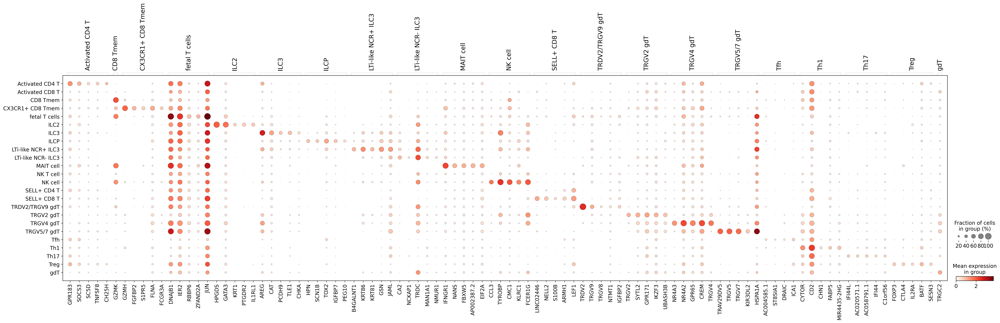

In [28]:
mkst = calc_marker_stats(adata_L1, groupby="clusters4")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata_L1, groupby='clusters4', mks=mks)

In [29]:
import pandas as pd

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(adata_L1, mks, groupby="clusters4" , n_genes=100, use_raw=True, method="wilcoxon")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [30]:
df.to_csv("/mnt/2021Jan02/figures/Tcell_markers05.csv")

In [48]:
ON = {O:N for O,N in zip(adata_L1.obs_names,adata_L1.obs["clusters4"])}
adata_full.obs["Integrated_05"] = [ON[O] if O in ON else N for O,N in zip(adata_full.obs_names,adata_full.obs["Integrated_05"])]

In [60]:
Tcells = adata_full[adata_full.obs.category.isin(['T cells'])]
Tcells.obs
Tcells.obs.Integrated_05.value_counts()

SELL+ CD4 T           7470
Activated CD8 T       5738
Activated CD4 T       3948
Treg                  3927
SELL+ CD8 T           2526
Tfh                   2501
gdT                   2354
NK cell               2059
CD8 Tmem              1730
NK T cell             1058
LTi-like NCR- ILC3     884
Th17                   681
LTi-like NCR+ ILC3     626
TRGV2 gdT              604
TRGV5/7 gdT            595
TRGV4 gdT              491
ILC3                   413
ILCP                   411
Th1                    224
fetal T cells          165
TRDV2/TRGV9 gdT        157
CX3CR1+ CD8 Tmem       111
MAIT cell              104
ILC2                    62
Name: Integrated_05, dtype: int64

Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


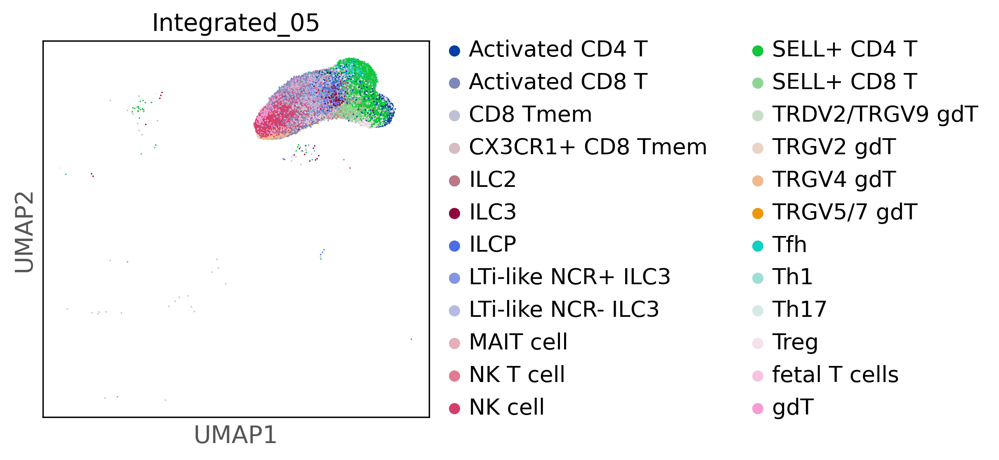

In [62]:
sc.pl.umap(Tcells, color= ["Integrated_05"])

In [35]:
adata_full.write("/mnt/2021Jan02/Fullobject_integrated_05.h5ad")

... storing 'Integrated_05' as categorical


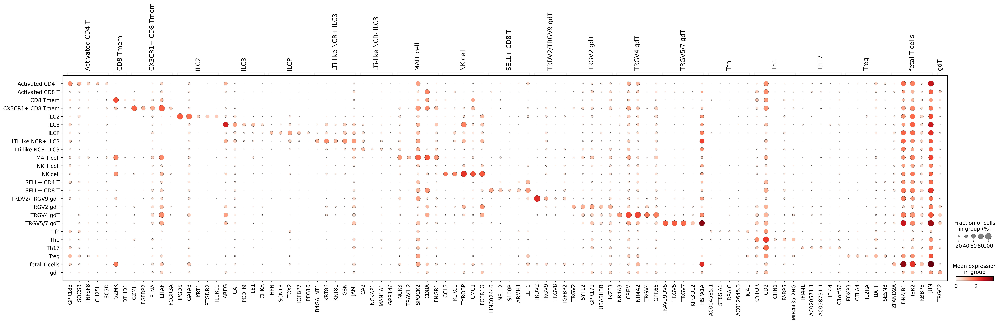

In [78]:
mkst = calc_marker_stats(Tcells, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(Tcells, groupby='Integrated_05', mks=mks)

In [79]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(Tcells, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [80]:
df.to_csv("/mnt/2021Jan02/figures/Tcell_markers05.csv")

In [67]:
epi = adata_full[adata_full.obs.category.isin(['Epithelial'])]
epi.obs
epi.obs.Integrated_05.value_counts()

TA                       50025
Enterocyte               37460
Colonocyte               14133
Proximal progenitor       9656
Stem cells                8077
Goblet cell               5330
BEST4+ epithelial         4555
Distal progenitor         3080
Paneth                    3064
BEST2+ Goblet cell        3025
Tuft                       737
EECs                       485
Microfold cell             457
EC cells (TAC1+)           422
Progenitor (NEUROG3+)      336
M/X cells (MLN/GHRL+)      297
CLDN10+ cells              260
I cells (CCK+)             227
D cells (SST+)             143
L cells (PYY+)             118
K cells (GIP+)              83
EC cells (NPW+)             59
N cells (NTS+)              44
β cells (INS+)              31
Name: Integrated_05, dtype: int64

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


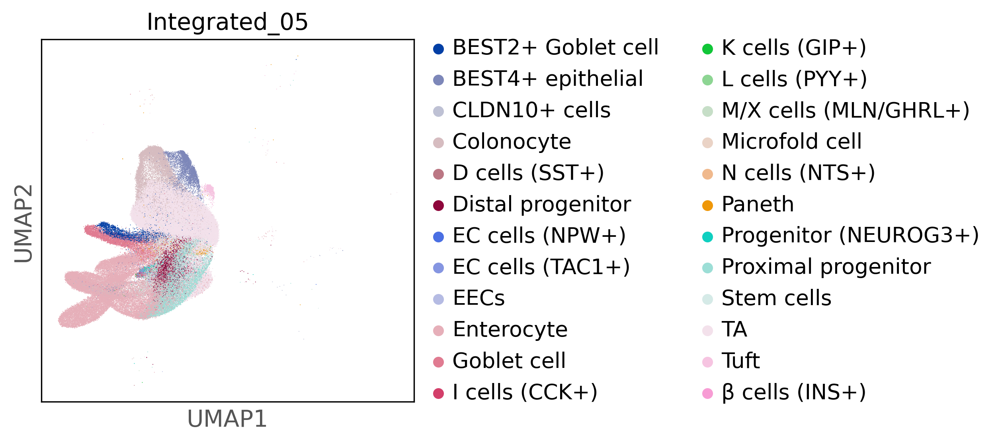

In [68]:
sc.pl.umap(epi, color= ["Integrated_05"])

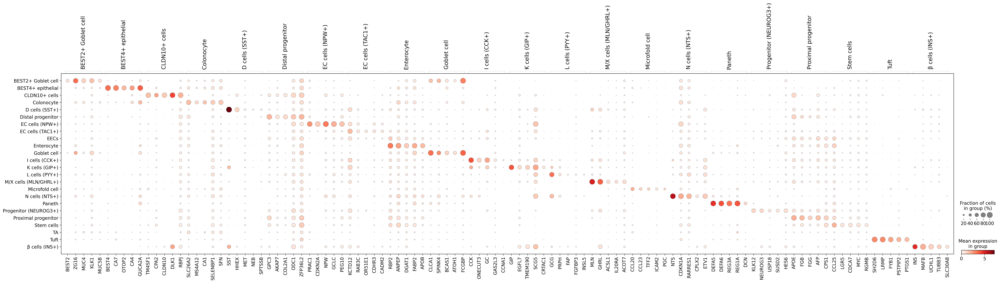

In [69]:
mkst = calc_marker_stats(epi, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(epi, groupby='Integrated_05', mks=mks)

In [76]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(epi, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [77]:
df.to_csv("/mnt/2021Jan02/figures/epi_markers05.csv")

In [81]:
mes = adata_full[adata_full.obs.category.isin(['Mesenchymal'])]
mes.obs
mes.obs.Integrated_05.value_counts()

Mesoderm 2 (ZEB2+)              34753
Mesoderm 1 (HAND1+)             29442
SMC (PLPP2+)                    13219
Stromal 3 (C7+)                 12641
Stromal 1 (ADAMDEC1+)           11554
cycling stromal                  8770
Stromal 2 (NPY+)                 7258
SMC (PART1/CAPN3+)               5736
myofibroblast (RSPO2+)           5670
Stromal 2 (CH25H+)               5621
Immature pericyte                4522
Stromal 3 (KCNN3+)               4403
Transitional Stromal 3 (C3+)     3658
Contractile pericyte (PLN+)      2784
Stromal 1 (CCL11+)               2529
ICC                              1404
Mesothelium                      1248
angiogenic pericyte              1062
Mesothelium (RGS5+)               931
Stromal 4 (MMP1+)                 640
Pericyte                          584
T reticular                       421
myofibroblast                     421
mLTo                              410
mLN Stroma (FMO2+)                355
FDC                               203
Mesothelium 

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


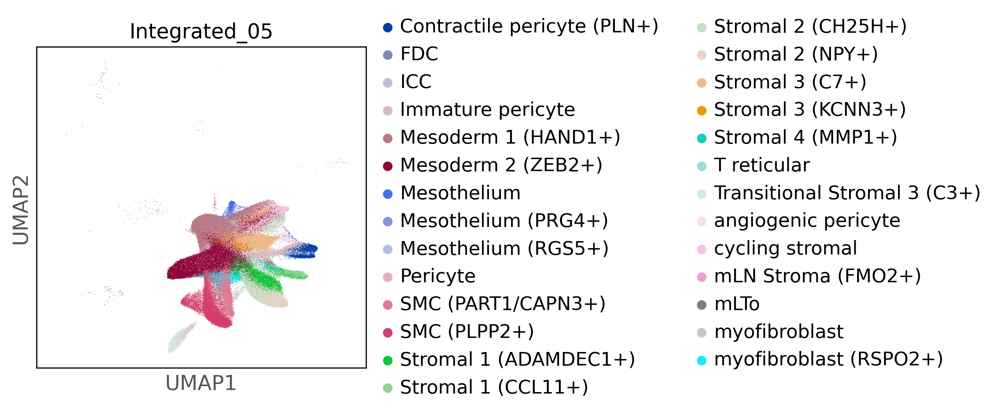

In [82]:
sc.pl.umap(mes, color= ["Integrated_05"])

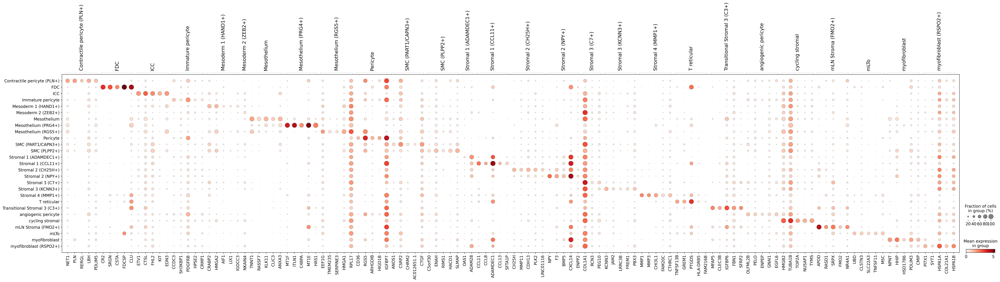

In [83]:
mkst = calc_marker_stats(mes, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(mes, groupby='Integrated_05', mks=mks)

In [84]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(mes, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")
df.to_csv("/mnt/2021Jan02/figures/mes_markers05.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)


In [85]:
adata_full.obs.category.unique()

['B cells', 'T cells', 'Epithelial', 'Mesenchymal', 'Plasma cells', 'Myeloid', 'Endothelial', 'Neuronal', 'Red blood cells']
Categories (9, object): ['B cells', 'T cells', 'Epithelial', 'Mesenchymal', ..., 'Myeloid', 'Endothelial', 'Neuronal', 'Red blood cells']

In [88]:
b = adata_full[adata_full.obs.category.isin(['B cells','Plasma cells','Red blood cells'])]
b.obs
b.obs.Integrated_05.value_counts()

IgA plasma cell        16882
Memory B                6073
Naive B                 5982
Cycling B cell          2199
IgG plasma cell         1596
RBC                     1391
GC B cell               1306
Cycling plasma cell     1157
STAT1+ Naive B          1059
DZ GC cell               851
Immature B               847
LZ GC cell               628
Pro-B                    522
Pre-B                    426
FCRL4+ Memory B          308
IgM plasma cell          266
CLP                      186
Name: Integrated_05, dtype: int64

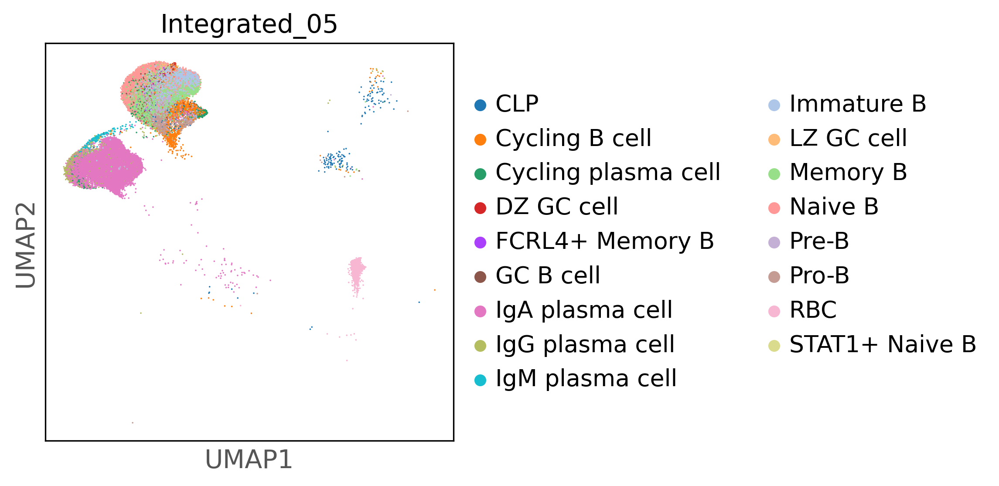

In [90]:
sc.pl.umap(b, color= ["Integrated_05"])

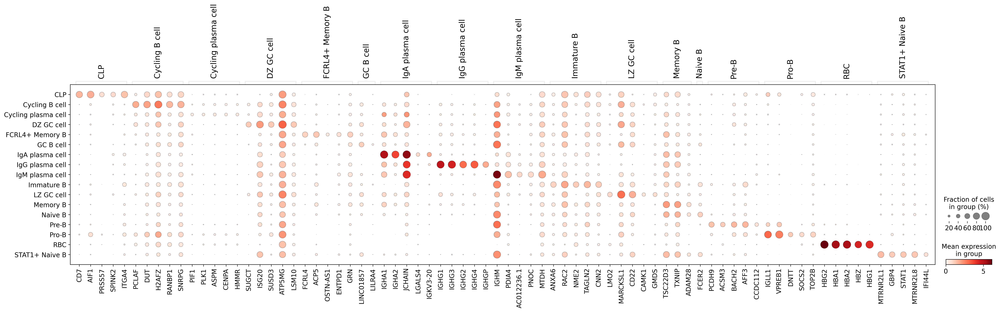

In [91]:
mkst = calc_marker_stats(b, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(b, groupby='Integrated_05', mks=mks)

In [92]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(b, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")
df.to_csv("/mnt/2021Jan02/figures/b_markers05.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [93]:
m = adata_full[adata_full.obs.category.isin([ 'Myeloid'])]
m.obs
m.obs.Integrated_05.value_counts()

Macrophages                      4019
LYVE1+ Macrophage                2662
cDC2                             2029
Monocytes                        1233
Mast cell                         432
cDC1                              431
MMP9+ Inflammatory macrophage     333
pDC                               219
Lymphoid DC                       203
CLC+ Mast cell                    142
MPO+ mono-neutrophil              117
Megakaryocyte                      59
Name: Integrated_05, dtype: int64

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


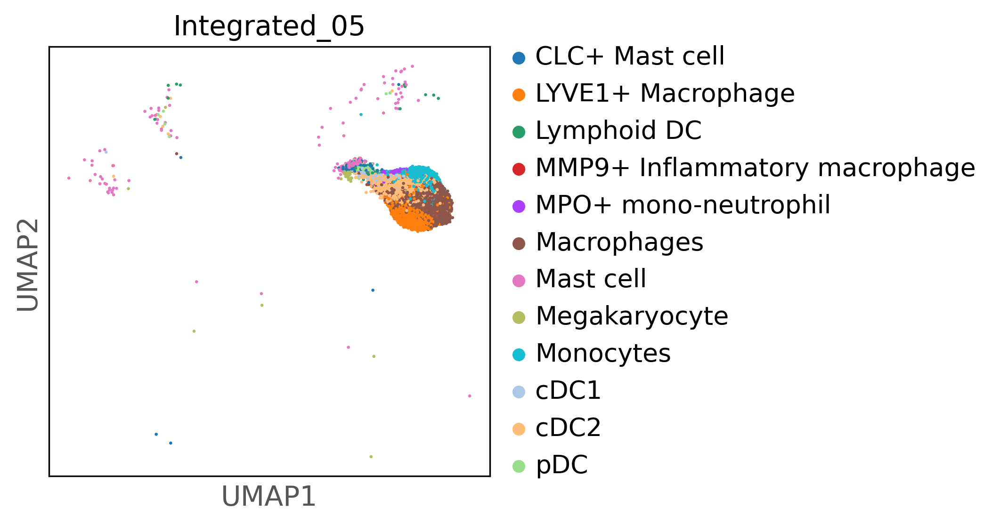

In [94]:
sc.pl.umap(m, color= ["Integrated_05"])

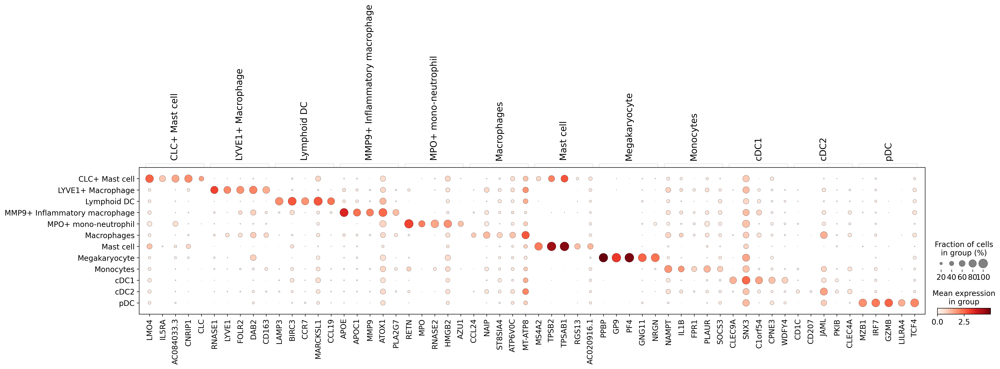

In [95]:
mkst = calc_marker_stats(m, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(m, groupby='Integrated_05', mks=mks)

In [96]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(m, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")
df.to_csv("/mnt/2021Jan02/figures/mye_markers05.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [97]:
e = adata_full[adata_full.obs.category.isin([ 'Endothelial'])]
e.obs
e.obs.Integrated_05.value_counts()

venous capillary      3682
Mature venous EC      2776
Fetal arterial EC     2059
Mature arterial EC    1568
arterial capillary    1277
Fetal venous EC        982
LEC4 (STAB2+)          876
cycling EC             719
LEC1 (ACKR4+)          685
LEC6 (ADAMTS4+)        522
LEC3 (ADGRG3+)         390
LEC5 (CLDN11+)         136
LEC2 (MADCAM1+)         47
Name: Integrated_05, dtype: int64

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


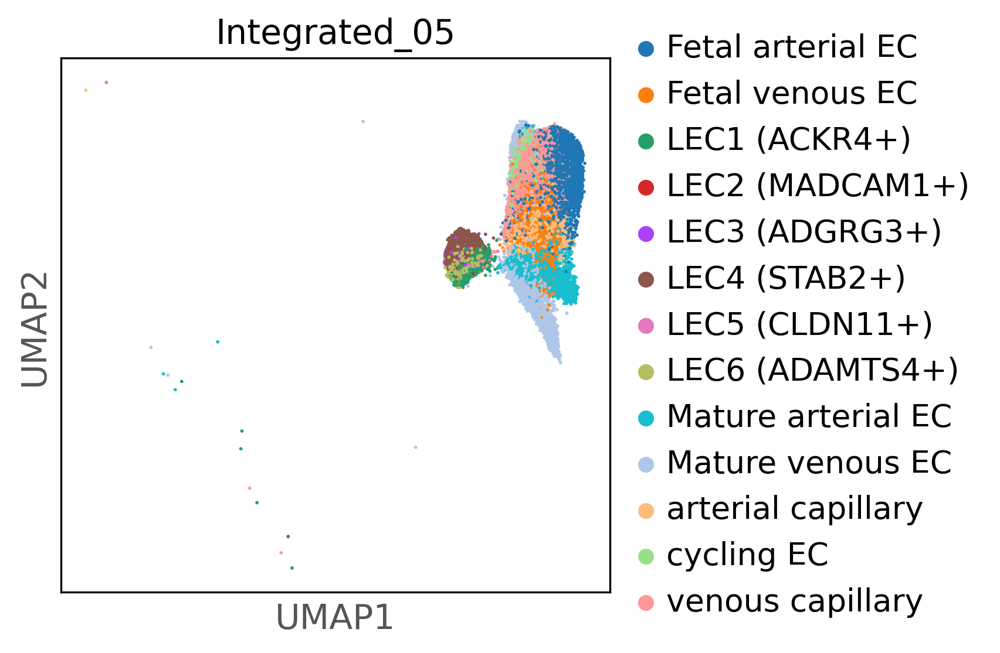

In [98]:
sc.pl.umap(e, color= ["Integrated_05"])

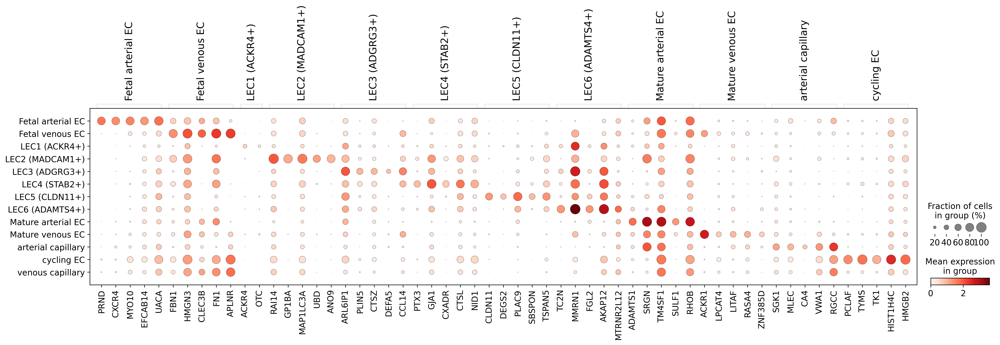

In [99]:
mkst = calc_marker_stats(e, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(e, groupby='Integrated_05', mks=mks)

In [100]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(e, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")
df.to_csv("/mnt/2021Jan02/figures/en_markers05.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [101]:

n = adata_full[adata_full.obs.category.isin([ 'Neuronal',])]
n.obs
n.obs.Integrated_05.value_counts()


ENCC/glia Progenitor    3257
cycling ENCC/glia       2969
Branch B1 (eMN)         1938
Branch A1 (iMN)         1742
Neuroblast              1656
Glia 3 (BCAN+)          1451
Glia 1 (DHH+)           1002
cycling neuroblast       699
Branch A2 (IPAN/IN)      699
Adult Glia               580
Glia 2 (ELN+)            554
Branch B2 (eMN)          512
Differentiating glia     459
Branch A3 (IPAN/IN)      272
Branch A4 (IN)           136
Branch B3 (IPAN)          59
Name: Integrated_05, dtype: int64

/usr/local/lib/python3.6/dist-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Integrated_05' as categorical


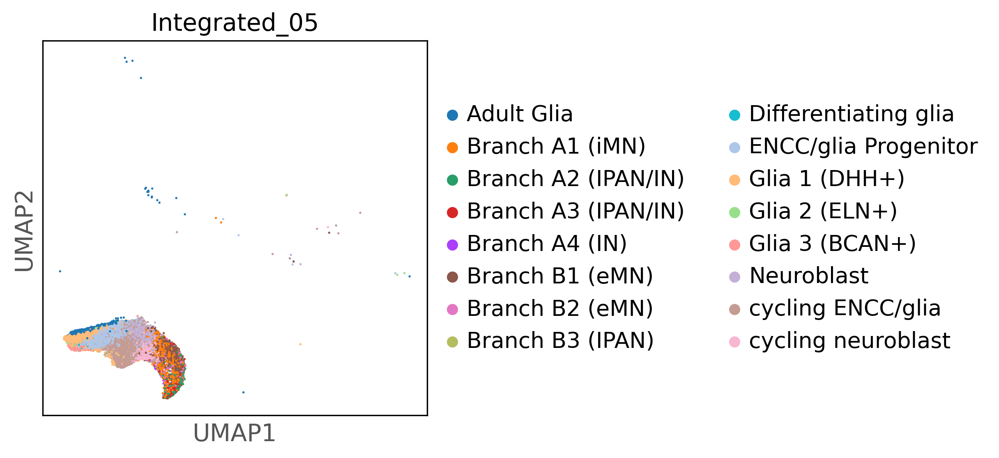

In [102]:
sc.pl.umap(n, color= ["Integrated_05"])

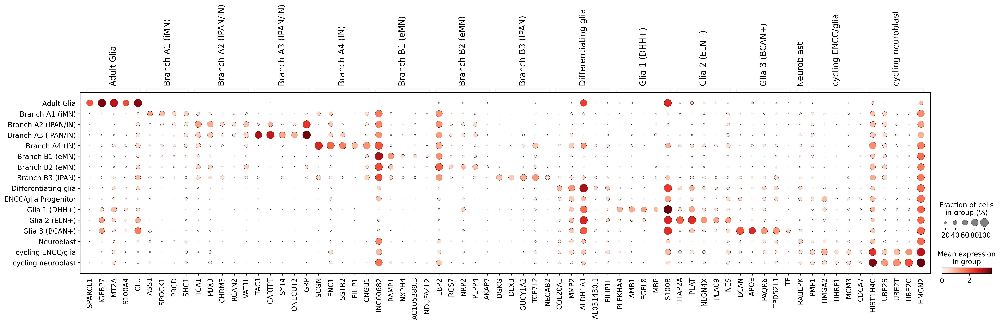

In [103]:
mkst = calc_marker_stats(n, groupby="Integrated_05")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(n, groupby='Integrated_05', mks=mks)

In [104]:
mks = mks.groupby('top_frac_group').head(50)

def top_markers(df, top_n=5, groupby='top_frac_group'):
    return pd.Series(df.groupby(groupby).head(top_n).index).to_list()

df = test_markers(n, mks, groupby="Integrated_05" , n_genes=100, use_raw=True, method="wilcoxon")
df.to_csv("/mnt/2021Jan02/figures/n_markers05.csv")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [106]:
adata_full.obs.Integrated_05.value_counts()

TA                     50025
Enterocyte             37460
Mesoderm 2 (ZEB2+)     34753
Mesoderm 1 (HAND1+)    29442
IgA plasma cell        16882
                       ...  
EC cells (NPW+)           59
LEC2 (MADCAM1+)           47
N cells (NTS+)            44
β cells (INS+)            31
Mesothelium (PRG4+)       25
Name: Integrated_05, Length: 133, dtype: int64